In [1]:
import os
from glob import glob
import numpy as np
import dask
import xarray as xr
from dask import compute, delayed
from matplotlib import pyplot as plt
%matplotlib inline

from mitequinox.utils import *

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/cmocean/tools.py:76: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if not mpl.cbook.is_string_like(rgbin[0]):


In [2]:
from dask_jobqueue import PBSCluster
local_dir = os.getenv('TMPDIR')
cluster = PBSCluster(local_directory=local_dir)
#print(cluster.job_script())
w = cluster.start_workers(20)

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/distributed/utils.py:128: RuntimeWarning: Couldn't detect a suitable IP address for reaching '8.8.8.8', defaulting to '127.0.0.1': [Errno 101] Network is unreachable
  % (host, default, e), RuntimeWarning)


In [3]:
# get dask handles and check dask server status
from dask.distributed import Client
client = Client(cluster)

In [4]:
client

Client Scheduler: tcp://10.148.1.31:49603 Dashboard: http://10.148.1.31:8787/status,Cluster Workers: 40 Cores: 160 Memory: 2000.00 GB


# Read nc_dataset

_____


In [5]:
Nf = 1
data_dir = '/home1/scratch/xyu/mit_nc_t/'

filenames_Eta = sorted(glob(data_dir+'Eta_*.nc'))
filenames_Eta = filenames_Eta[:Nf]
ds_Eta = xr.open_mfdataset(filenames_Eta, concat_dim='time', compat='equals')

filenames_SSU = sorted(glob(data_dir+'SSU_*.nc'))
filenames_SSU = filenames_SSU[:Nf]
ds_SSU = xr.open_mfdataset(filenames_SSU, concat_dim='time', compat='equals')

filenames_SSV = sorted(glob(data_dir+'SSV_*.nc'))
filenames_SSV = filenames_SSV[:Nf]
ds_SSV = xr.open_mfdataset(filenames_SSV, concat_dim='time', compat='equals')

filenames_SSS = sorted(glob(data_dir+'SSS_*.nc'))
filenames_SSS = filenames_SSS[:Nf]
ds_SSS = xr.open_mfdataset(filenames_SSS, concat_dim='time', compat='equals')

filenames_SST = sorted(glob(data_dir+'SST_*.nc'))
filenames_SST = filenames_SST[:Nf]
ds_SST = xr.open_mfdataset(filenames_SST, concat_dim='time', compat='equals')

grid = xr.open_dataset('/home1/scratch/xyu/mit_grid.nc', decode_coords=True)


In [6]:
ds = xr.merge([ds_Eta, ds_SSU, ds_SSV, ds_SSS, ds_SST, grid])
print(ds)

<xarray.Dataset>
Dimensions:  (face: 13, i: 4320, i_g: 4320, j: 4320, j_g: 4320, time: 1)
Coordinates:
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * time     (time) float64 5.702e+06
    dtime    (time) datetime64[ns] dask.array<shape=(1,), chunksize=(1,)>
  * i_g      (i_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
  * j_g      (j_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
    XC       (face, j, i) float32 ...
    YC       (face, j, i) float32 ...
    XG       (face, j_g, i_g) float32 ...
    YG       (face, j_g, i_g) float32 ...
    rA       (face, j, i) float32 ...
    dxG      (face, j_g, i) float32 ...
    dyG      (face, j, i_g) float32 ...
    Depth    (face, j, i) float32 ...
    rAz      (face, j_g, i_g) float32 ...
    dxC      (face, j, i_g) float32 ...
    dyC      (

In [7]:
def quick_llc_plot(data, axis_off=False, **kwargs):
    face_to_axis = {0: (2, 0), 1: (1, 0), 2: (0, 0),
                    3: (2, 1), 4: (1, 1), 5: (0, 1),
                    7: (0, 2), 8: (1, 2), 9: (2, 2),
                    10: (0, 3), 11: (1, 3), 12: (2, 3)}
    transpose = [7, 8, 9, 10, 11, 12]
    gridspec_kw = dict(left=0, bottom=0, right=4, top=4, wspace=0, hspace=0)
    fig, axes = plt.subplots(nrows=3, ncols=4, gridspec_kw=gridspec_kw)
    for face, (j, i) in face_to_axis.items():
        data_ax = data.isel(face=face)
        ax = axes[j,i]
        yincrease = True
        if face in transpose:
            data_ax = data_ax.transpose()
            yincrease = False
        data_ax.plot(ax=ax, yincrease=yincrease, **kwargs)
        if axis_off:
            ax.axis('off')
        ax.set_title('')

# Global maps

distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.0:55220 remote=tcp://10.148.1.0:57229>
distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.0:55227 remote=tcp://10.148.1.0:57229>
distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.0:55228 remote=tcp://10.148.1.0:57229>
distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.0:55231 remote=tcp://10.148.1.0:57229>


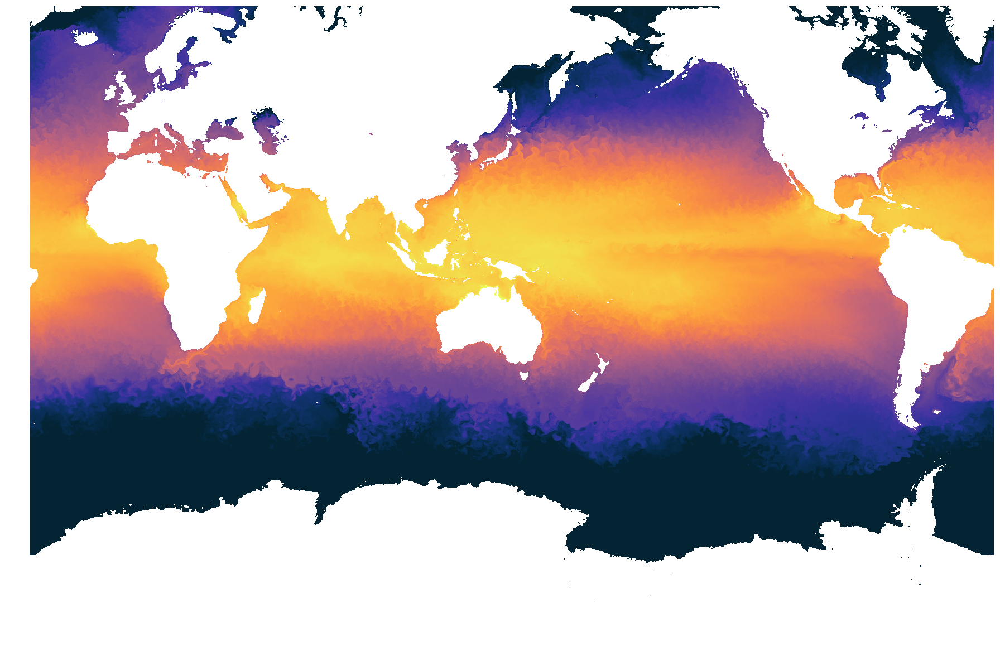

distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.0:48081 remote=tcp://10.148.1.0:57229>
distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.0:48083 remote=tcp://10.148.1.0:57229>


In [9]:
quick_llc_plot(ds['SST'], vmin=0, vmax=32, add_colorbar=False, axis_off=True, cmap = cm.thermal)

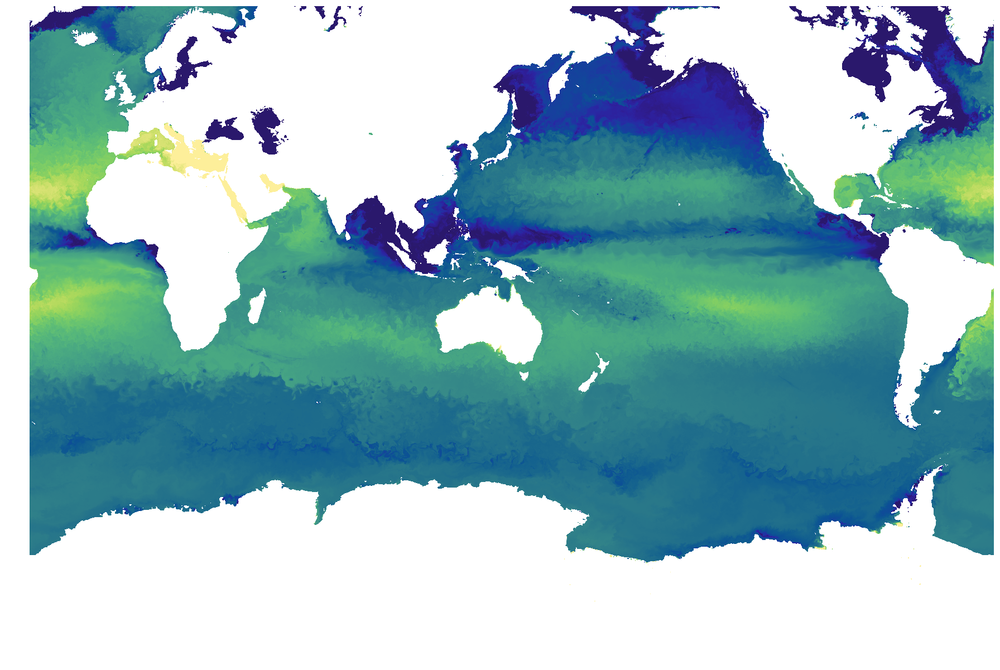

In [12]:
quick_llc_plot(ds['SSS'], vmin=32, vmax=37, add_colorbar=False, axis_off=True, cmap = cm.haline)

distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.0:47587 remote=tcp://10.148.1.0:57229>
distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.0:49045 remote=tcp://10.148.1.0:57229>
distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.0:49048 remote=tcp://10.148.1.0:57229>


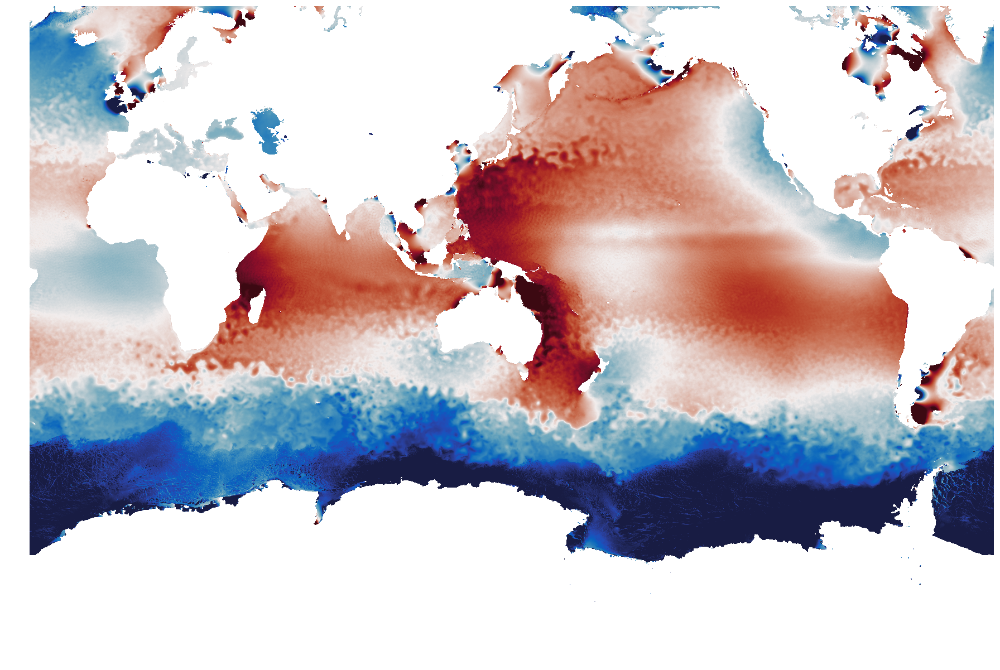

In [10]:
quick_llc_plot(ds['Eta'], vmin=-2, vmax=2, add_colorbar=False, axis_off=True, cmap = cm.balance)


distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.31:48417 remote=tcp://10.148.1.31:49603>
distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.31:51005 remote=tcp://10.148.1.31:49603>
distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.31:53026 remote=tcp://10.148.1.31:49603>
distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.31:54461 remote=tcp://10.148.1.31:49603>
distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.31:54463 remote=tcp://10.148.1.31:49603>


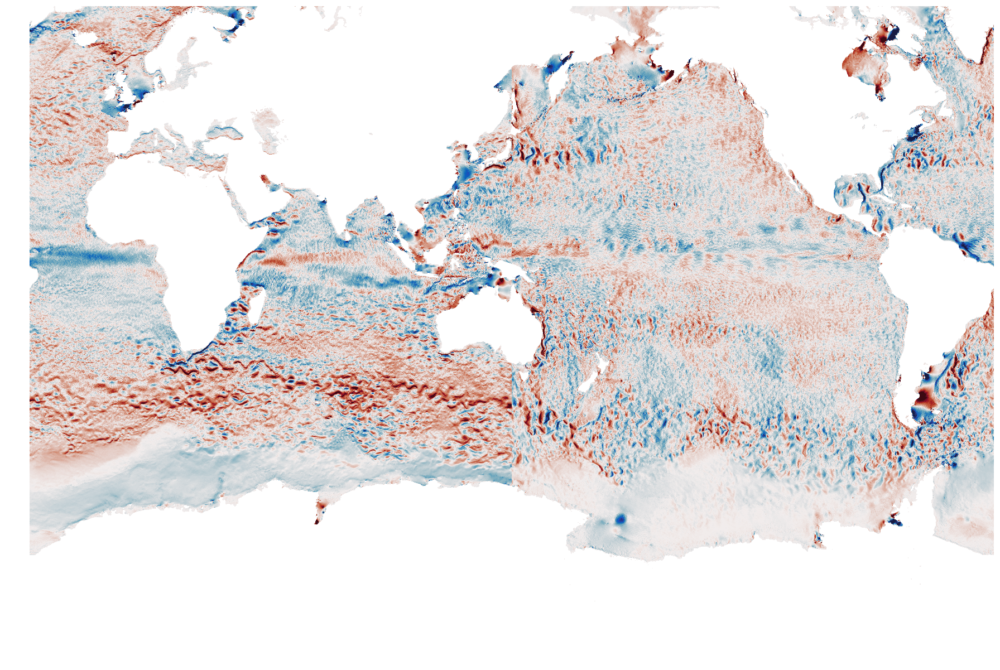

In [8]:
quick_llc_plot(ds['SSU'], vmin=-1, vmax=1, add_colorbar=False, axis_off=True, cmap = cm.balance)

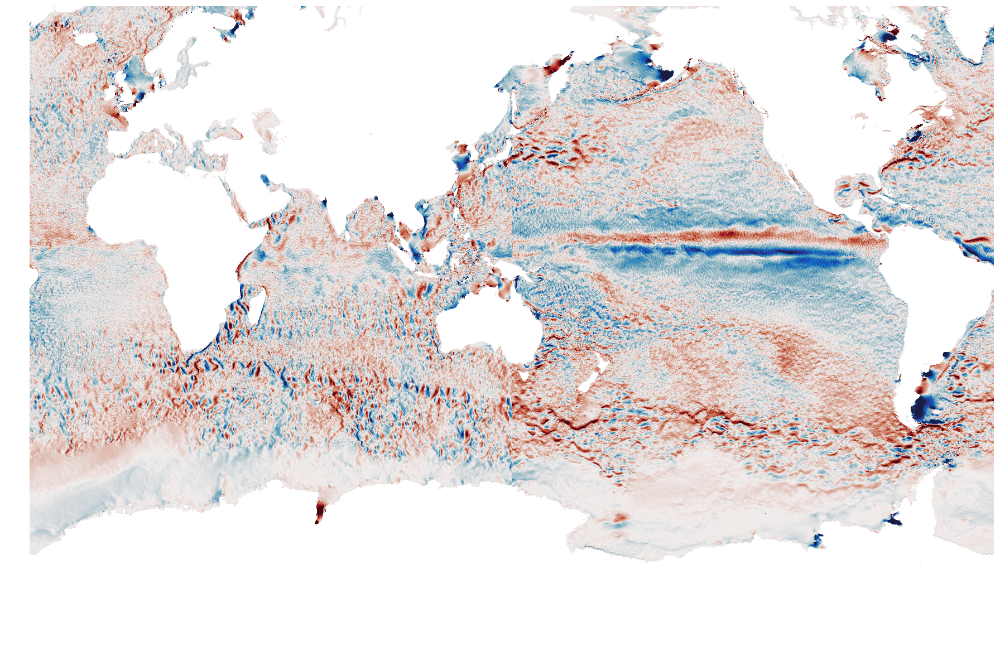

In [9]:
quick_llc_plot(ds['SSV'], vmin=-1, vmax=1, add_colorbar=False, axis_off=True, cmap = cm.balance)

# SSU 

u = meridional component for faces 7-12

In [10]:
SSU_1 = ds['SSU'].isel(face=slice(0,7))
print(SSU_1)

<xarray.DataArray 'SSU' (time: 1, face: 7, j: 4320, i_g: 4320)>
dask.array<shape=(1, 7, 4320, 4320), dtype=float32, chunksize=(1, 7, 4320, 4320)>
Coordinates:
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * face     (face) int64 0 1 2 3 4 5 6
  * time     (time) float64 5.702e+06
    dtime    (time) datetime64[ns] dask.array<shape=(1,), chunksize=(1,)>
  * i_g      (i_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
    dyG      (face, j, i_g) float32 ...
    dxC      (face, j, i_g) float32 ...
    rAw      (face, j, i_g) float32 ...


In [11]:
SSU_2 = ds['SSV'].isel(face=slice(7,13))
print(SSU_2)

<xarray.DataArray 'SSV' (time: 1, face: 6, j_g: 4320, i: 4320)>
dask.array<shape=(1, 6, 4320, 4320), dtype=float32, chunksize=(1, 6, 4320, 4320)>
Coordinates:
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * face     (face) int64 7 8 9 10 11 12
  * time     (time) float64 5.702e+06
    dtime    (time) datetime64[ns] dask.array<shape=(1,), chunksize=(1,)>
  * j_g      (j_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
    dxG      (face, j_g, i) float32 ...
    dyC      (face, j_g, i) float32 ...
    rAs      (face, j_g, i) float32 ...


In [12]:
SSU_2 = np.real(SSU_2).rename('SSU')
print(SSU_2)

<xarray.DataArray 'SSU' (time: 1, face: 6, j_g: 4320, i: 4320)>
dask.array<shape=(1, 6, 4320, 4320), dtype=float32, chunksize=(1, 6, 4320, 4320)>
Coordinates:
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * face     (face) int64 7 8 9 10 11 12
  * time     (time) float64 5.702e+06
    dtime    (time) datetime64[ns] dask.array<shape=(1,), chunksize=(1,)>
  * j_g      (j_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
    dxG      (face, j_g, i) float32 ...
    dyC      (face, j_g, i) float32 ...
    rAs      (face, j_g, i) float32 ...


In [14]:
ds_SSU = xr.merge([SSU_1.rename({'i_g': 'i'}),
                  SSU_2.rename({'j_g': 'j'})])
print(ds_SSU)

<xarray.Dataset>
Dimensions:  (face: 13, i: 4320, j: 4320, time: 1)
Coordinates:
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * time     (time) float64 5.702e+06
    dtime    (time) datetime64[ns] dask.array<shape=(1,), chunksize=(1,)>
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
    dyG      (face, j, i) float32 478.96072 478.9889 479.01703 479.0451 ...
    dxC      (face, j, i) float32 324.6357 324.63788 324.64 324.64215 ...
    rAw      (face, j, i) float32 155487.83 155497.98 155508.08 155518.31 ...
    dxG      (face, j, i) float32 nan nan nan nan nan nan nan nan nan nan ...
    dyC      (face, j, i) float32 nan nan nan nan nan nan nan nan nan nan ...
    rAs      (face, j, i) float32 nan nan nan nan nan nan nan nan nan nan ...
Data variables:
    SSU      (time, face, j, i) float32 dask.array<shape=(1, 13, 4320, 4320), chunksize=(1, 13, 4320, 4320)>


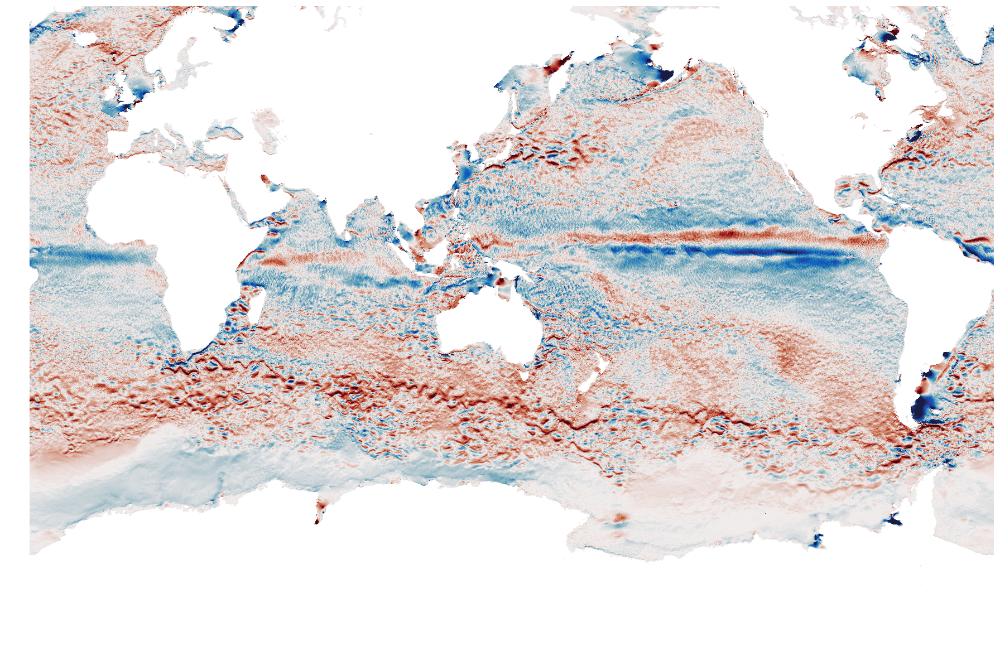

In [17]:
quick_llc_plot(ds_SSU['SSU'], vmin=-1, vmax=1, add_colorbar=False, axis_off=True, cmap = cm.balance)


# SSV 
  v = -zonal component for faces 7-12

In [18]:
SSV_1 = ds['SSV'].isel(face=slice(0,7))
print(SSV_1)

<xarray.DataArray 'SSV' (time: 1, face: 7, j_g: 4320, i: 4320)>
dask.array<shape=(1, 7, 4320, 4320), dtype=float32, chunksize=(1, 7, 4320, 4320)>
Coordinates:
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * face     (face) int64 0 1 2 3 4 5 6
  * time     (time) float64 5.702e+06
    dtime    (time) datetime64[ns] dask.array<shape=(1,), chunksize=(1,)>
  * j_g      (j_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
    dxG      (face, j_g, i) float32 ...
    dyC      (face, j_g, i) float32 ...
    rAs      (face, j_g, i) float32 ...


In [19]:
SSV_2 = -1*ds['SSU'].isel(face=slice(7,13))
print(SSV_2)

<xarray.DataArray 'SSU' (time: 1, face: 6, j: 4320, i_g: 4320)>
dask.array<shape=(1, 6, 4320, 4320), dtype=float32, chunksize=(1, 6, 4320, 4320)>
Coordinates:
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * face     (face) int64 7 8 9 10 11 12
  * time     (time) float64 5.702e+06
    dtime    (time) datetime64[ns] dask.array<shape=(1,), chunksize=(1,)>
  * i_g      (i_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
    dyG      (face, j, i_g) float32 ...
    dxC      (face, j, i_g) float32 ...
    rAw      (face, j, i_g) float32 ...


In [20]:
SSV_2 = np.real(SSV_2).rename('SSV')
print(SSV_2)

<xarray.DataArray 'SSV' (time: 1, face: 6, j: 4320, i_g: 4320)>
dask.array<shape=(1, 6, 4320, 4320), dtype=float32, chunksize=(1, 6, 4320, 4320)>
Coordinates:
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * face     (face) int64 7 8 9 10 11 12
  * time     (time) float64 5.702e+06
    dtime    (time) datetime64[ns] dask.array<shape=(1,), chunksize=(1,)>
  * i_g      (i_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
    dyG      (face, j, i_g) float32 ...
    dxC      (face, j, i_g) float32 ...
    rAw      (face, j, i_g) float32 ...


In [21]:
ds_SSV = xr.merge([SSV_1.rename({'j_g': 'j'}),
                   SSV_2.rename({'i_g': 'i'})])
print(ds_SSV)

<xarray.Dataset>
Dimensions:  (face: 13, i: 4320, j: 4320, time: 1)
Coordinates:
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * time     (time) float64 5.702e+06
    dtime    (time) datetime64[ns] dask.array<shape=(1,), chunksize=(1,)>
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
    dxG      (face, j, i) float32 324.63684 324.639 324.64114 324.64328 ...
    dyC      (face, j, i) float32 239.48717 239.50125 239.51529 239.52933 ...
    rAs      (face, j, i) float32 77743.875 77748.9 77753.945 77759.03 ...
    dyG      (face, j, i) float32 nan nan nan nan nan nan nan nan nan nan ...
    dxC      (face, j, i) float32 nan nan nan nan nan nan nan nan nan nan ...
    rAw      (face, j, i) float32 nan nan nan nan nan nan nan nan nan nan ...
Data variables:
    SSV      (time, face, j, i) float32 dask.array<shape=(1, 13, 4320, 4320), chunksize=(1, 13, 4320, 4320)>


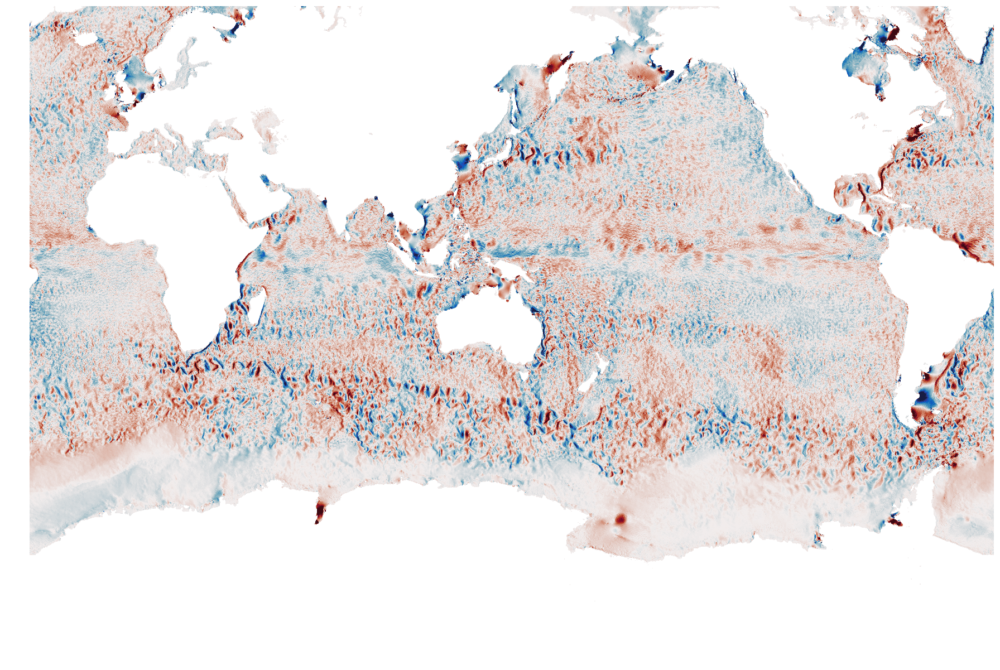

In [22]:
quick_llc_plot(ds_SSV['SSV'], vmin=-1, vmax=1, add_colorbar=False, axis_off=True, cmap = cm.balance)


In [24]:
cluster.scheduler.close()

<Future finished result=None>